## Imports

In [65]:
import math
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf
import statsmodels.api as sm
import scipy.stats as sps

from sklearn.metrics import r2_score, mean_squared_error
from sklearn.preprocessing import StandardScaler, RobustScaler
from sklearn.feature_selection import RFECV, VarianceThreshold
from sklearn.model_selection import StratifiedKFold, train_test_split, GridSearchCV, ParameterGrid, KFold
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import GradientBoostingRegressor, RandomForestRegressor
from sklearn.impute import SimpleImputer

from catboost import CatBoostRegressor, Pool

from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP

sns.set(font_scale=1.2, palette='Set2')

plt.rcParams['font.family'] = 'DejaVu Serif'
plt.rcParams['lines.linewidth'] = 2
plt.rcParams['lines.markersize'] = 12
plt.rcParams['xtick.labelsize'] = 16
plt.rcParams['ytick.labelsize'] = 24
plt.rcParams['legend.fontsize'] = 24
plt.rcParams['axes.titlesize'] = 30
plt.rcParams['axes.labelsize'] = 24
plt.rcParams["figure.figsize"] = (12, 7)

SEED = 42

## Read data

In [2]:
df_train = pd.read_csv('data/train.csv')
df_test = pd.read_csv('data/test.csv')

In [3]:
df_train

,id,timestamp,full_sq,life_sq,floor,max_floor,material,build_year,num_room,kitch_sq,...,cafe_count_5000_price_2500,cafe_count_5000_price_4000,cafe_count_5000_price_high,big_church_count_5000,church_count_5000,mosque_count_5000,leisure_count_5000,sport_count_5000,market_count_5000,price_doc
0,1,2011-08-20,43,27.0,4.0,NaN,NaN,NaN,NaN,NaN,...,9,4,0,13,22,1,0,52,4,5850000
1,2,2011-08-23,34,19.0,3.0,NaN,NaN,NaN,NaN,NaN,...,15,3,0,15,29,1,10,66,14,6000000
2,3,2011-08-27,43,29.0,2.0,NaN,NaN,NaN,NaN,NaN,...,10,3,0,11,27,0,4,67,10,5700000
3,4,2011-09-01,89,50.0,9.0,NaN,NaN,NaN,NaN,NaN,...,11,2,1,4,4,0,0,26,3,13100000
4,5,2011-09-05,77,77.0,4.0,NaN,NaN,NaN,NaN,NaN,...,319,108,17,135,236,2,91,195,14,16331452
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30466,30469,2015-06-30,44,27.0,7.0,9.0,1.0,1975.0,2.0,6.0,...,15,5,0,15,26,1,2,84,6,7400000
30467,30470,2015-06-30,86,59.0,3.0,9.0,2.0,1935.0,4.0,10.0,...,313,128,24,98,182,1,82,171,15,25000000
30468,30471,2015-06-30,45,NaN,10.0,20.0,1.0,NaN,1.0,1.0,...,1,1,0,2,12,0,1,11,1,6970959
30469,30472,2015-06-30,64,32.0,5.0,15.0,1.0,2003.0,2.0,11.0,...,22,1,1,6,31,1,4,65,7,13500000


Look at missing values

In [4]:
print(df_train.isna().sum().to_string())

id                                           0
timestamp                                    0
full_sq                                      0
life_sq                                   6383
floor                                      167
max_floor                                 9572
material                                  9572
build_year                               13605
num_room                                  9572
kitch_sq                                  9572
state                                    13559
product_type                                 0
sub_area                                     0
area_m                                       0
raion_popul                                  0
green_zone_part                              0
indust_part                                  0
children_preschool                           0
preschool_quota                           6688
preschool_education_centers_raion            0
children_school                              0
school_quota 

In [5]:
temp = df_train.dtypes.to_string().split()
names, dtypes = temp[::2], temp[1::2]
names_and_types = dict(zip(names, dtypes))

Plot target distribution in log-scale

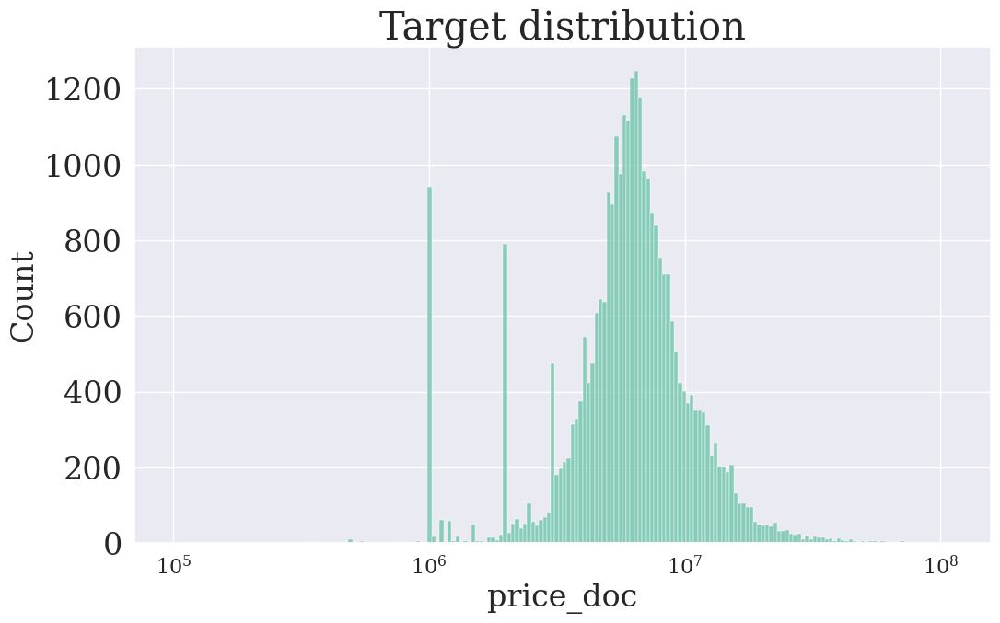

In [6]:
plt.xscale('log')
sns.histplot(df_train['price_doc'], ax=plt.gca())
plt.title('Target distribution')
plt.show()

In [7]:
df_train[['price_doc']].describe(percentiles=(.25, .75, .95, .99)).round(-4)

,price_doc
count,30000.0
mean,7120000.0
std,4780000.0
min,100000.0
25%,4740000.0
50%,6270000.0
75%,8300000.0
95%,14500000.0
99%,24530000.0
max,111110000.0


Take logarithm from (target + 1)

Add +1 for comfortable calculation of RMSLE ~-- Root Mean Squared Log Error 

In [8]:
target = np.log(df_train['price_doc'] + 1)
df_train.drop(columns=['id', 'price_doc'], inplace=True)
df_train['log_price_doc'] = target

Drop excess features

In [9]:
# these ids describe the location of the apartment, and we already have such columns

df_train = df_train.drop([
    'ID_metro',
    'ID_railroad_station_walk',
    'ID_railroad_station_avto',
    'ID_big_road1',
    'ID_big_road2',
    'ID_railroad_terminal',
    'ID_bus_terminal'],
    axis=1
)

### Featuers filtration

Extract numeric and categorical features

In [10]:
numeric_columns = df_train.loc[:,df_train.dtypes!=np.object_].columns
categorical_columns = df_train.loc[:,df_train.dtypes==np.object_].columns

Filter numeric features with low target correlation

In [11]:
# Get correlations of numeric features
corr_dct = dict()

for col in numeric_columns:
    notna_mask = df_train[col].notna()
    corr_dct[col] = np.corrcoef(df_train[col][notna_mask], target[notna_mask])[1, 0]

In [12]:
sorted(corr_dct.items(), key=lambda x: abs(x[1]), reverse=True)

[('log_price_doc', 1.0),
 ('num_room', 0.4276929106766108),
 ('full_sq', 0.27140750411940173),
 ('zd_vokzaly_avto_km', -0.24868059926628008),
 ('sadovoe_km', -0.24647329804653464),
 ('ttk_km', -0.2428544568359151),
 ('kremlin_km', -0.242355631909981),
 ('bulvar_ring_km', -0.2421065442322637),
 ('nuclear_reactor_km', -0.2383131315750388),
 ('trc_count_5000', 0.22814311536891405),
 ('sport_count_5000', 0.22338609664831982),
 ('basketball_km', -0.21949432083068782),
 ('sport_count_3000', 0.21942936728704243),
 ('stadium_km', -0.2174036514111719),
 ('sport_count_2000', 0.21312602063320846),
 ('metro_min_avto', -0.212059334991717),
 ('trc_sqm_5000', 0.21026795062506207),
 ('swim_pool_km', -0.2097184520550967),
 ('detention_facility_km', -0.20547928881665065),
 ('workplaces_km', -0.20313425220923478),
 ('exhibition_km', -0.20284038764447113),
 ('catering_km', -0.2021192361218136),
 ('metro_min_walk', -0.20172171513811782),
 ('metro_km_walk', -0.20172171512687545),
 ('thermal_power_plant_km',

In [13]:
k_alive_features = list(filter(lambda x: abs(x[1]) >= 0.05, corr_dct.items())).__len__()
k_alive_features

207

In [14]:
numeric_columns_2 = list(map(lambda x: x[0], sorted(corr_dct.items(), key=lambda x: abs(x[1]), reverse=True)[:k_alive_features]))
numeric_columns_2

['log_price_doc',
 'num_room',
 'full_sq',
 'zd_vokzaly_avto_km',
 'sadovoe_km',
 'ttk_km',
 'kremlin_km',
 'bulvar_ring_km',
 'nuclear_reactor_km',
 'trc_count_5000',
 'sport_count_5000',
 'basketball_km',
 'sport_count_3000',
 'stadium_km',
 'sport_count_2000',
 'metro_min_avto',
 'trc_sqm_5000',
 'swim_pool_km',
 'detention_facility_km',
 'workplaces_km',
 'exhibition_km',
 'catering_km',
 'metro_min_walk',
 'metro_km_walk',
 'thermal_power_plant_km',
 'big_church_km',
 'sport_count_1500',
 'sport_objects_raion',
 'office_km',
 'metro_km_avto',
 'university_km',
 'trc_count_3000',
 'office_sqm_5000',
 'radiation_km',
 'fitness_km',
 'park_km',
 'theater_km',
 'ts_km',
 'public_healthcare_km',
 'shopping_centers_km',
 'trc_sqm_3000',
 'school_education_centers_raion',
 'museum_km',
 'market_shop_km',
 'power_transmission_line_km',
 'cafe_count_5000_price_1000',
 'bus_terminal_avto_km',
 'market_count_5000',
 'office_sqm_3000',
 'school_km',
 'cafe_count_5000_price_1500',
 'additional

Draw correlogram of remaining numerical features

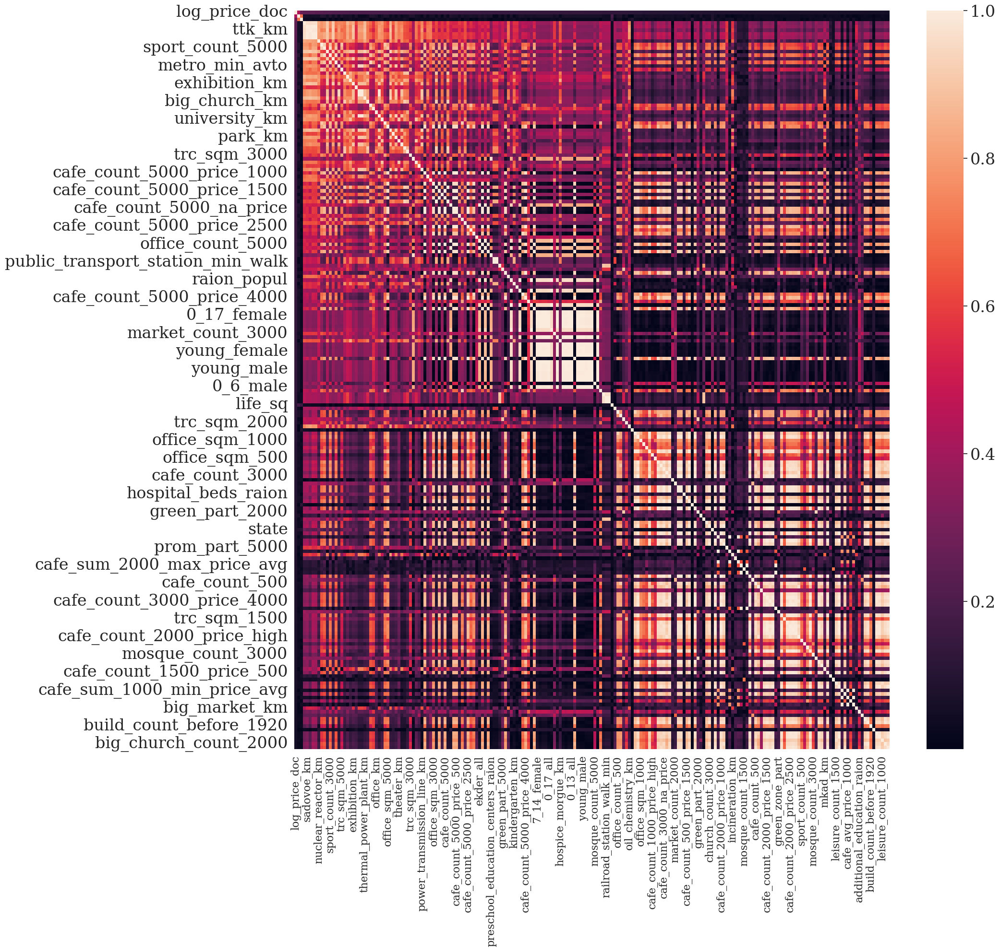

In [15]:
plt.figure(figsize=(20, 20))
sns.heatmap(df_train[numeric_columns_2].corr().abs(), annot=False)
plt.show()

Filter numeric features via mutual correlation

In [16]:
def upper_diagonal_boolean_mask(size):
    """
    Generates an upper diagonal boolean mask for a square matrix of a given size.
    
    Parameters:
    - size: int, the size of the square matrix (n x n).
    
    Returns:
    - A boolean mask where True represents the upper diagonal elements.
    """
    # Create an n x n matrix filled with 1's. The specific values don't matter since we only care about the structure.
    matrix = np.ones((size, size))
    
    # Generate the upper diagonal mask, excluding the main diagonal (k=1).
    mask = np.triu(matrix, k=1) > 0
    
    return mask

<Axes: title={'center': 'Correlation distribution'}, ylabel='Count'>

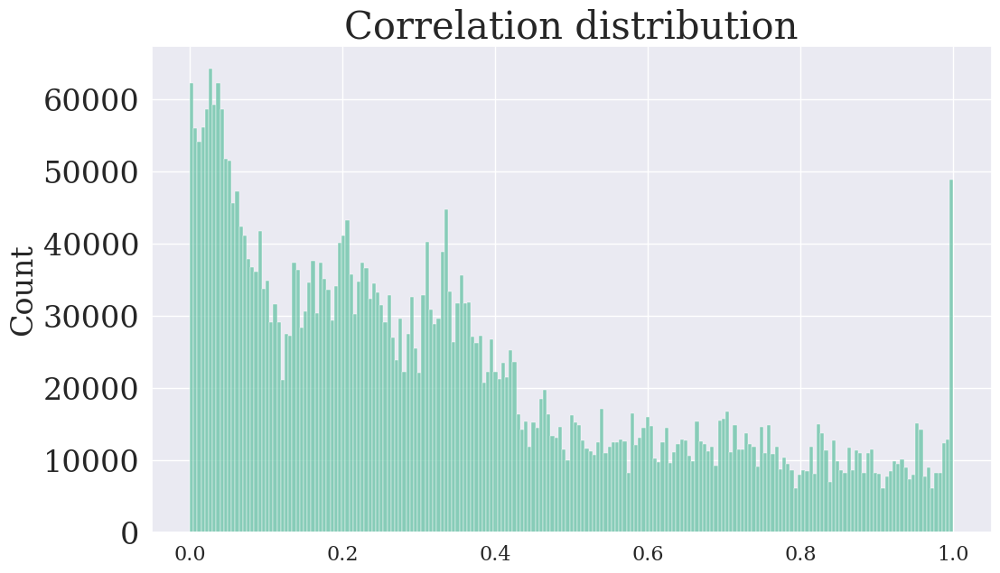

In [17]:
mask = upper_diagonal_boolean_mask(len(numeric_columns_2))

temp = np.ravel(df_train[numeric_columns_2].corr().abs()[mask])
plt.title('Correlation distribution')
sns.histplot(temp)

In [18]:
def get_redundant_pairs(df):
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

def get_top_abs_correlations(df, n=5):
    au_corr = df.corr().abs().unstack()
    labels_to_drop = get_redundant_pairs(df)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=False)
    return au_corr[0:n]


print("Top Absolute Correlations")
print(get_top_abs_correlations(df_train[numeric_columns_2], 20))

Top Absolute Correlations
public_transport_station_km  public_transport_station_min_walk    1.000000
metro_min_walk               metro_km_walk                        1.000000
children_school              7_14_all                             1.000000
children_preschool           0_6_all                              1.000000
railroad_station_walk_min    railroad_station_walk_km             1.000000
0_13_all                     young_all                            0.999885
0_13_female                  young_female                         0.999871
0_13_male                    young_male                           0.999861
0_17_all                     young_all                            0.999712
0_17_male                    young_male                           0.999687
0_17_female                  young_female                         0.999673
0_17_all                     0_13_all                             0.999445
school_km                    preschool_km                         0.999431

In [19]:
### Let's remove columns where the correlation is > 0.9

def correlation(dataset, threshold):
    col_corr = set() # Set of all the names of deleted columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (corr_matrix.iloc[i, j] >= threshold) and (corr_matrix.columns[j] not in col_corr):
                colname = corr_matrix.columns[i] # getting the name of column
                col_corr.add(colname)
                if colname in dataset.columns:
                    del dataset[colname] # deleting the column from the dataset
    
    return dataset

                    
df_train_3 = correlation(df_train[numeric_columns_2], 0.9)
numeric_columns_3 = df_train_3.columns

Look at the features with low variation

In [20]:
scaler = RobustScaler()
df_train_3_norm = scaler.fit_transform(df_train_3)
df_train_3_norm_df = pd.DataFrame(df_train_3_norm, columns=df_train_3.columns)

cutter = VarianceThreshold(threshold=0.1)
cutter.fit(df_train_3_norm_df)
constant_cols = [x for x in numeric_columns_3 if x not in cutter.get_feature_names_out()]

df_train_3[constant_cols]

,mosque_count_1500,mosque_count_2000,mosque_count_1000
0,0,0,0
1,0,0,0
2,0,0,0
3,0,0,0
4,0,0,0
...,...,...,...
30466,0,1,0
30467,0,0,0
30468,0,0,0
30469,0,0,0


Filter categorical variables

In [21]:
for column in categorical_columns:
    if column == 'timestamp':
        continue
    
    print ("____________________________________________")
    
    print(f'{column}')
    print('Number of categories:', len(set(df_train[column])))
    print(set(df_train[column]))

____________________________________________
product_type
Number of categories: 2
{'Investment', 'OwnerOccupier'}
____________________________________________
sub_area
Number of categories: 146
{'Preobrazhenskoe', 'Donskoe', 'Teplyj Stan', 'Fili Davydkovo', 'Meshhanskoe', "Sokol'niki", 'Begovoe', 'Ochakovo-Matveevskoe', 'Ivanovskoe', "Kuz'minki", 'Severnoe Medvedkovo', 'Izmajlovo', 'Poselenie Desjonovskoe', 'Troickij okrug', "Chertanovo Central'noe", 'Birjulevo Vostochnoe', 'Poselenie Pervomajskoe', 'Poselenie Krasnopahorskoe', 'Dorogomilovo', 'Danilovskoe', "Mar'ina Roshha", 'Shhukino', 'Ostankinskoe', 'Vostochnoe Izmajlovo', 'Chertanovo Severnoe', 'Dmitrovskoe', 'Ljublino', 'Gagarinskoe', 'Severnoe Tushino', 'Veshnjaki', 'Taganskoe', 'Marfino', 'Staroe Krjukovo', 'Solncevo', 'Jaroslavskoe', 'Krylatskoe', "Moskvorech'e-Saburovo", 'Juzhnoportovoe', 'Poselenie Filimonkovskoe', 'Cheremushki', 'Juzhnoe Medvedkovo', 'Poselenie Mosrentgen', 'Poselenie Marushkinskoe', 'Timirjazevskoe', "Zamo

In [22]:
df_train_cat = None

for col in categorical_columns:
    if col in ('timestamp', 'ecology'):
        continue
        
    if df_train[col].nunique() < 5:
        one_hot = pd.get_dummies(df_train[col], prefix=col, drop_first=True)
        df_train_cat = pd.concat((df_train_cat, one_hot), axis=1)

    else:
        mean_target = df_train.groupby(col)['log_price_doc'].mean()
        df_train_cat[col] = df_train[col].map(mean_target)

In [23]:
def ecology_func(eco: str) -> int:
    if eco == 'no data':
        return 0
    elif eco == 'poor':
        return 1
    elif eco == 'satisfactory':
        return 2
    elif eco == 'good':
        return 3
    elif eco == 'excellent':
        return 4


df_train_cat['ecology_rng'] = df_train['ecology'].apply(ecology_func)

Union of filtered features

In [24]:
df_train_filt = pd.concat((df_train_cat, df_train[numeric_columns_3]), axis=1)
df_train_filt

,product_type_OwnerOccupier,sub_area,culture_objects_top_25_yes,thermal_power_plant_raion_yes,incineration_raion_yes,oil_chemistry_raion_yes,radiation_raion_yes,railroad_terminal_raion_yes,big_market_raion_yes,nuclear_reactor_raion_yes,...,indust_part,mosque_count_1000,cafe_sum_1000_min_price_avg,trc_count_500,big_market_km,additional_education_raion,market_count_1000,build_count_before_1920,green_zone_km,leisure_count_1000
0,False,15.594247,False,False,False,False,False,False,False,False,...,0.000070,0,527.78,0,10.814172,3,1,0.0,0.600973,0
1,False,15.864842,True,False,False,False,False,False,False,False,...,0.049637,0,615.38,0,6.910568,1,0,1.0,0.065321,4
2,False,15.613141,False,False,False,False,True,False,False,False,...,0.118537,0,642.86,0,5.752368,1,3,1.0,0.453172,0
3,False,15.914449,False,False,False,False,False,False,False,False,...,0.069753,0,658.33,0,27.892717,6,1,13.0,0.106125,0
4,False,16.091227,False,False,False,False,True,True,False,False,...,0.037316,0,763.45,1,9.155057,2,0,371.0,0.236214,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
30466,False,15.627701,False,False,True,False,True,False,False,False,...,0.300323,0,666.67,2,8.820934,3,1,0.0,0.139814,0
30467,False,15.585972,True,False,False,False,True,True,False,False,...,0.000078,0,699.35,0,12.102735,16,0,263.0,0.271861,1
30468,True,15.602230,False,False,False,False,False,False,False,False,...,0.007122,0,1000.00,0,15.546028,0,0,NaN,0.427248,0
30469,False,16.158855,False,False,False,False,True,False,False,False,...,0.093443,0,753.85,0,2.515959,1,0,0.0,0.227547,0


Working with missing values

In [25]:
for col in df_train_filt.columns:
    df_train_filt[col] = df_train_filt[col].fillna(df_train_filt[col].median())

In [26]:
df_train_filt = df_train_filt.astype(float)

Study target's time dependence

In [27]:
df_train['timestamp'] = pd.to_datetime(df_train['timestamp'])

df_train_filt['month'] = df_train.timestamp.dt.month
df_train_filt['year'] = df_train.timestamp.dt.year

/tmp/ipykernel_25590/3175215607.py:3: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_train_filt['month'] = df_train.timestamp.dt.month
/tmp/ipykernel_25590/3175215607.py:4: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  df_train_filt['year'] = df_train.timestamp.dt.year


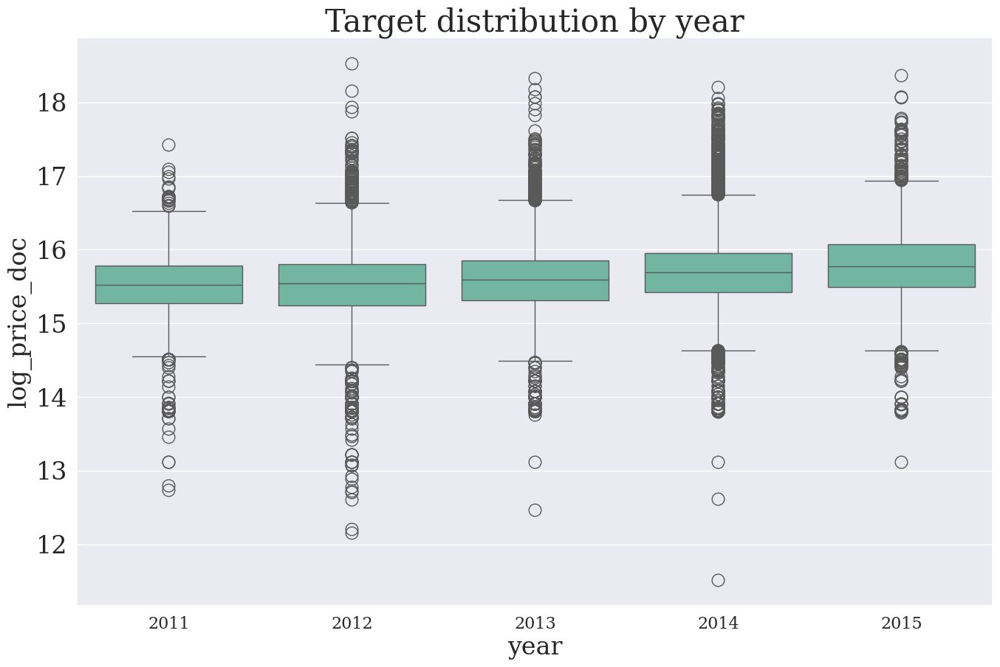

In [28]:
### target distribution by year

fig = plt.figure()
fig.set_size_inches(16, 10)
    
sns.boxplot(y='log_price_doc', x=df_train_filt['year'].astype('category'), data=df_train_filt)
plt.title("Target distribution by year")
plt.show()

The growth trend is visible, it makes sense to include it in the model

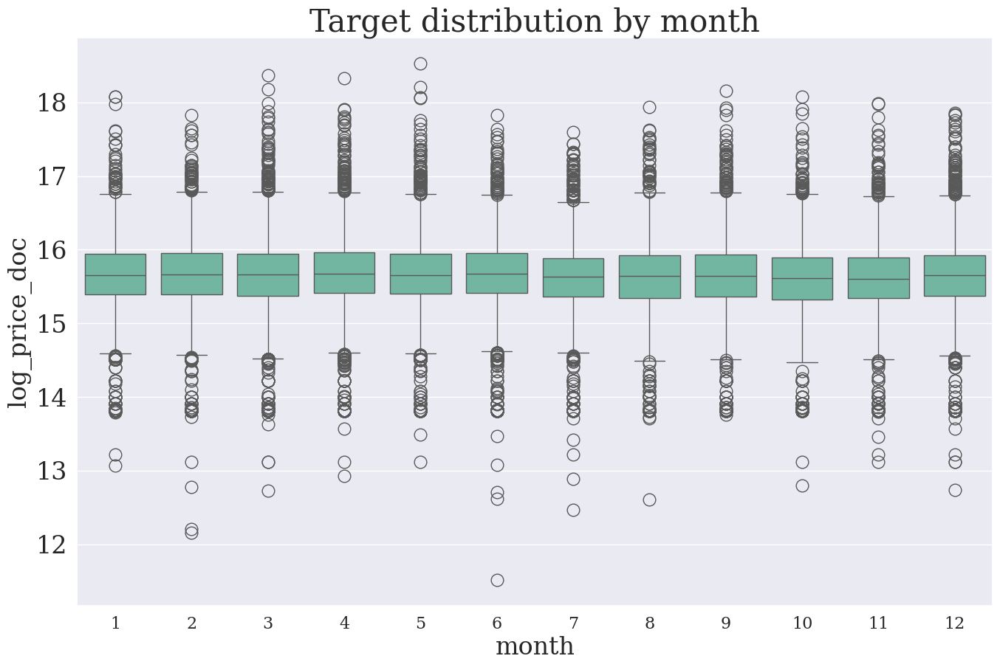

In [29]:
### Target distribution by month

fig = plt.figure()
fig.set_size_inches(16, 10)
    
sns.boxplot(y='log_price_doc', x=df_train_filt['month'].astype('category'), data=df_train_filt)
plt.title("Target distribution by month")
plt.show()

There is no dependence on the month, we do not add the month attribute

In [30]:
df_train_filt.drop('month', axis=1, inplace=True)

Filter features using linear regression

In [31]:
linr_regr_mod = sm.OLS(endog=target, exog=sm.add_constant(df_train_filt.drop('log_price_doc', axis=1))).fit()
linr_regr_mod.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_doc   R-squared:                       0.322
Model:                            OLS   Adj. R-squared:                  0.320
Method:                 Least Squares   F-statistic:                     125.6
Date:                Mon, 13 Jan 2025   Prob (F-statistic):               0.00
Time:                        22:04:38   Log-Likelihood:                -21972.
No. Observations:               30471   AIC:                         4.418e+04
Df Residuals:                   30355   BIC:                         4.514e+04
Df Model:                         115                                         
Covariance Type:            nonrobust                                         
=========================================================================================================
                                            coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------------------------
const                                  -199.5375      6.191    -32.229      0.000    -211.672    -187.403
product_type_OwnerOccupier                0.2114      0.011     20.005      0.000       0.191       0.232
sub_area                                  0.6186      0.032     19.279      0.000       0.556       0.681
culture_objects_top_25_yes               -0.0522      0.021     -2.462      0.014      -0.094      -0.011
thermal_power_plant_raion_yes            -0.0211      0.019     -1.095      0.274      -0.059       0.017
incineration_raion_yes                    0.0117      0.029      0.397      0.691      -0.046       0.069
oil_chemistry_raion_yes                   0.0683      0.040      1.714      0.087      -0.010       0.146
radiation_raion_yes                       0.0101      0.010      1.003      0.316      -0.010       0.030
railroad_terminal_raion_yes               0.0445      0.030      1.507      0.132      -0.013       0.102
big_market_raion_yes                     -0.0157      0.020     -0.785      0.433      -0.055       0.024
nuclear_reactor_raion_yes                 0.0308      0.023      1.324      0.186      -0.015       0.076
detention_facility_raion_yes              0.0124      0.016      0.768      0.442      -0.019       0.044
water_1line_yes                           0.0040      0.013      0.314      0.754      -0.021       0.029
big_road1_1line_yes                       0.0017      0.020      0.086      0.931      -0.037       0.040
railroad_1line_yes                       -0.1026      0.020     -5.242      0.000      -0.141      -0.064
ecology_rng                               0.0071      0.004      1.703      0.089      -0.001       0.015
num_room                                  0.2097      0.004     47.507      0.000       0.201       0.218
full_sq                                   0.0023    8.2e-05     27.644      0.000       0.002       0.002
zd_vokzaly_avto_km                       -0.0060      0.002     -2.971      0.003      -0.010      -0.002
nuclear_reactor_km                       -0.0048      0.002     -1.967      0.049      -0.010   -1.81e-05
trc_count_5000                            0.0010      0.001      1.414      0.157      -0.000       0.002
sport_count_3000                          0.0028      0.001      3.736      0.000       0.001       0.004
metro_min_avto                           -0.0110      0.002     -4.745      0.000      -0.016      -0.006
trc_sqm_5000                          -5.405e-09   1.18e-08     -0.459      0.647   -2.85e-08    1.77e-08
swim_pool_km                              0.0024      0.003      0.905      0.365      -0.003       0.008
detention_facility_km                     0.0028      0.002      1.828      0.068      -0.000       0.006
workplace

In [32]:
bad_columns = linr_regr_mod.pvalues[np.flatnonzero(linr_regr_mod.pvalues > 0.1)].index
bad_columns

/tmp/ipykernel_25590/164519585.py:1: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  bad_columns = linr_regr_mod.pvalues[np.flatnonzero(linr_regr_mod.pvalues > 0.1)].index


Index(['thermal_power_plant_raion_yes', 'incineration_raion_yes',
       'radiation_raion_yes', 'railroad_terminal_raion_yes',
       'big_market_raion_yes', 'nuclear_reactor_raion_yes',
       'detention_facility_raion_yes', 'water_1line_yes',
       'big_road1_1line_yes', 'trc_count_5000', 'trc_sqm_5000', 'swim_pool_km',
       'catering_km', 'thermal_power_plant_km', 'sport_count_1500',
       'office_km', 'university_km', 'office_sqm_5000', 'fitness_km',
       'theater_km', 'ts_km', 'public_healthcare_km', 'trc_sqm_3000',
       'school_education_centers_raion', 'power_transmission_line_km',
       'bus_terminal_avto_km', 'market_count_5000', 'ekder_male', 'area_m',
       'ice_rink_km', 'sport_count_1000', 'office_sqm_2000',
       'healthcare_centers_raion', 'green_part_5000', 'mosque_km',
       'kindergarten_km', 'big_road2_km', '7_14_female', 'market_count_3000',
       'hospice_morgue_km', 'church_synagogue_km', 'green_part_3000',
       'trc_sqm_2000', 'oil_chemistry_km', '

In [33]:
df_train_filt_2 = df_train_filt.drop(columns=bad_columns)

In [34]:
linr_regr_mod_2 = sm.OLS(endog=target, exog=sm.add_constant(df_train_filt_2.drop('log_price_doc', axis=1))).fit()
linr_regr_mod_2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:              price_doc   R-squared:                       0.320
Model:                            OLS   Adj. R-squared:                  0.319
Method:                 Least Squares   F-statistic:                     304.9
Date:                Mon, 13 Jan 2025   Prob (F-statistic):               0.00
Time:                        22:04:38   Log-Likelihood:                -22022.
No. Observations:               30471   AIC:                         4.414e+04
Df Residuals:                   30423   BIC:                         4.454e+04
Df Model:                          47                                         
Covariance Type:            nonrobust                                         
===============================================================================================
                                  coef    std err          t      P>|t|      [0.025      0.975]
-----------------------------------------------------------------------------------------------
const                        -198.4887      6.099    -32.542      0.000    -210.444    -186.534
product_type_OwnerOccupier      0.1836      0.009     19.464      0.000       0.165       0.202
sub_area                        0.6391      0.022     29.678      0.000       0.597       0.681
culture_objects_top_25_yes     -0.0516      0.018     -2.910      0.004      -0.086      -0.017
oil_chemistry_raion_yes         0.0921      0.031      2.938      0.003       0.031       0.154
railroad_1line_yes             -0.0823      0.018     -4.510      0.000      -0.118      -0.047
ecology_rng                     0.0113      0.003      3.517      0.000       0.005       0.018
num_room                        0.2089      0.004     47.468      0.000       0.200       0.218
full_sq                         0.0023   8.17e-05     27.943      0.000       0.002       0.002
zd_vokzaly_avto_km             -0.0093      0.001     -7.207      0.000      -0.012      -0.007
nuclear_reactor_km             -0.0041      0.001     -3.826      0.000      -0.006      -0.002
sport_count_3000                0.0034      0.001      5.781      0.000       0.002       0.005
metro_min_avto                 -0.0098      0.002     -5.665      0.000      -0.013      -0.006
detention_facility_km           0.0029      0.001      3.506      0.000       0.001       0.005
workplaces_km                  -0.0112      0.002     -6.264      0.000      -0.015      -0.008
exhibition_km                   0.0126      0.002      7.162      0.000       0.009       0.016
sport_objects_raion            -0.0041      0.001     -3.792      0.000      -0.006      -0.002
park_km                         0.0108      0.002      4.670      0.000       0.006       0.015
market_shop_km                 -0.0058      0.002     -3.435      0.001      -0.009      -0.003
additional_education_km        -0.0131      0.004     -3.610      0.000      -0.020      -0.006
trc_count_2000                 -0.0013      0.001     -1.062      0.288      -0.004       0.001
public_transport_station_km     0.0317      0.005      6.402      0.000       0.022       0.041
railroad_station_avto_min       0.0093      0.002      4.789      0.000       0.005       0.013
shopping_centers_raion          0.0066      0.001      4.690      0.000       0.004       0.009
mosque_count_5000               0.0171      0.008      2.221      0.026       0.002       0.032
railroad_station_walk_min      -0.0018      0.000     -7.170      0.000      -0.002      -0.001
life_sq                         0.0006    6.3e-05      8.935      0.000       0.000       0.001
office_count_500                0.0083      0.003      2.898      0.004       0.003       0.014
cafe_count_500_price_1000       0.0064      0.003      2.323      0.020       0.001       0.012
floor      

We reduced the number of signs by 2 times, without losing the quality (according to adj. R^2)

Next, we draw a graph of the joint distribution of the trait and the target variable

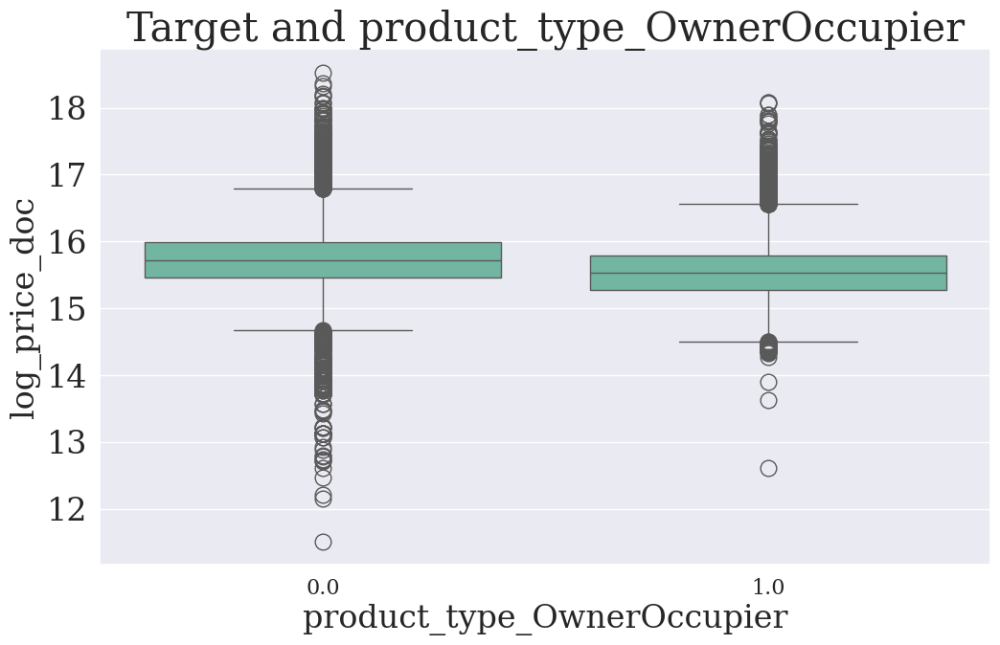

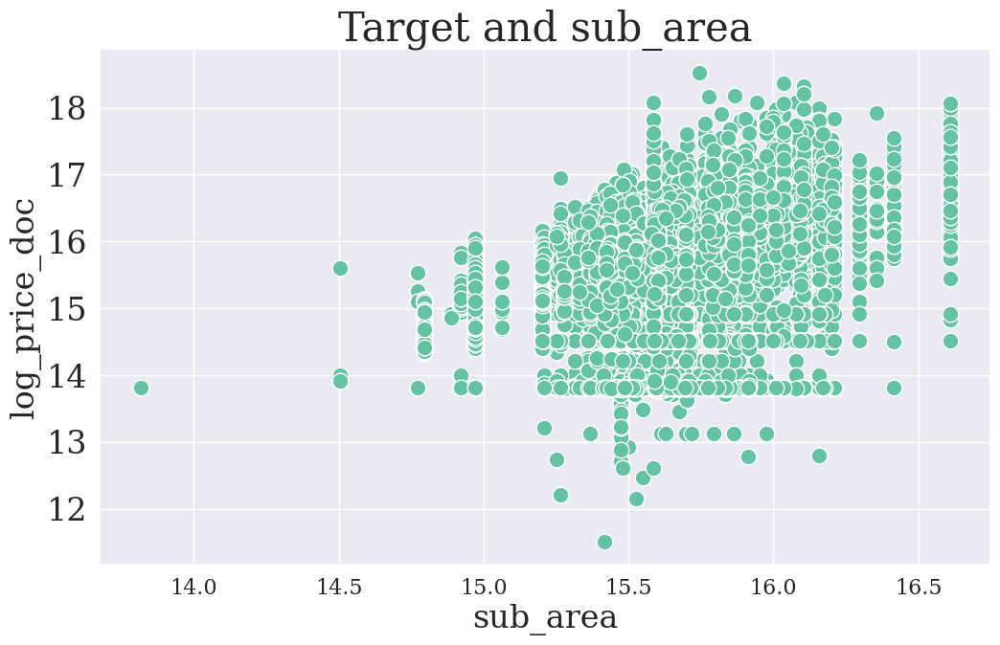

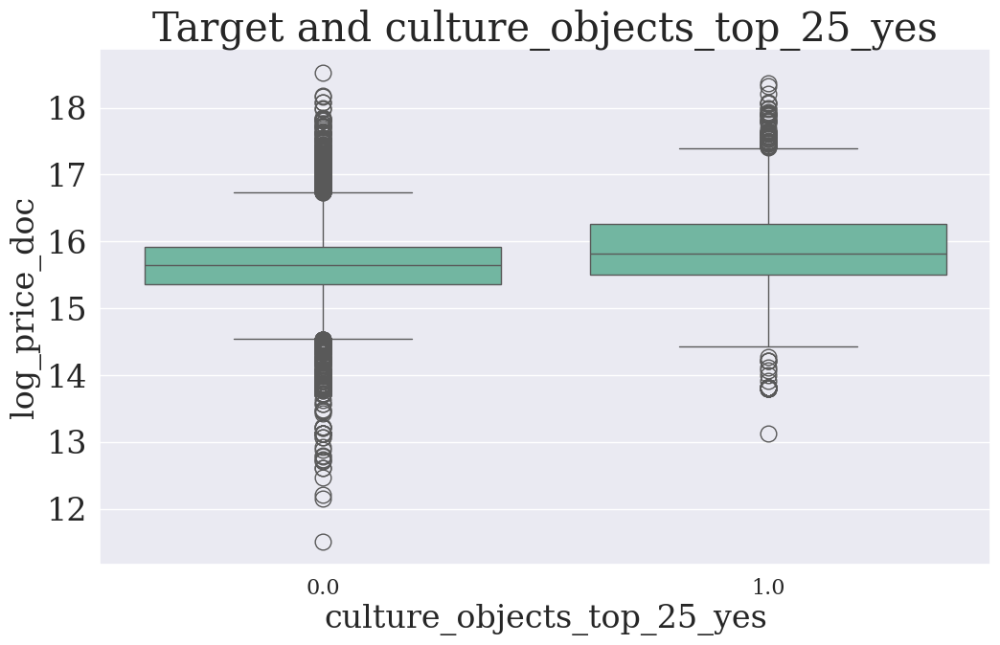

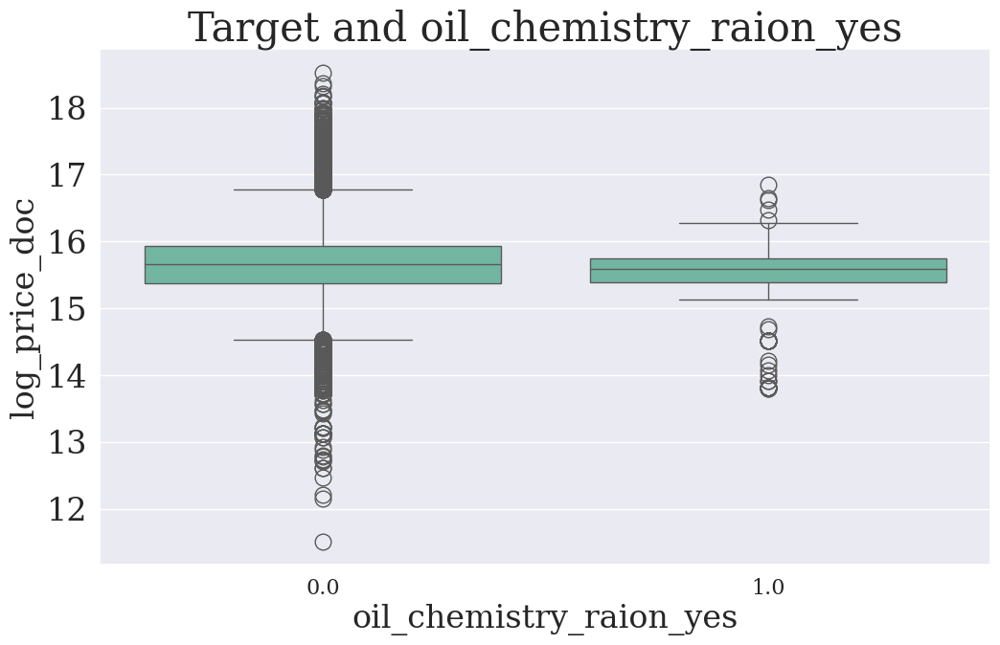

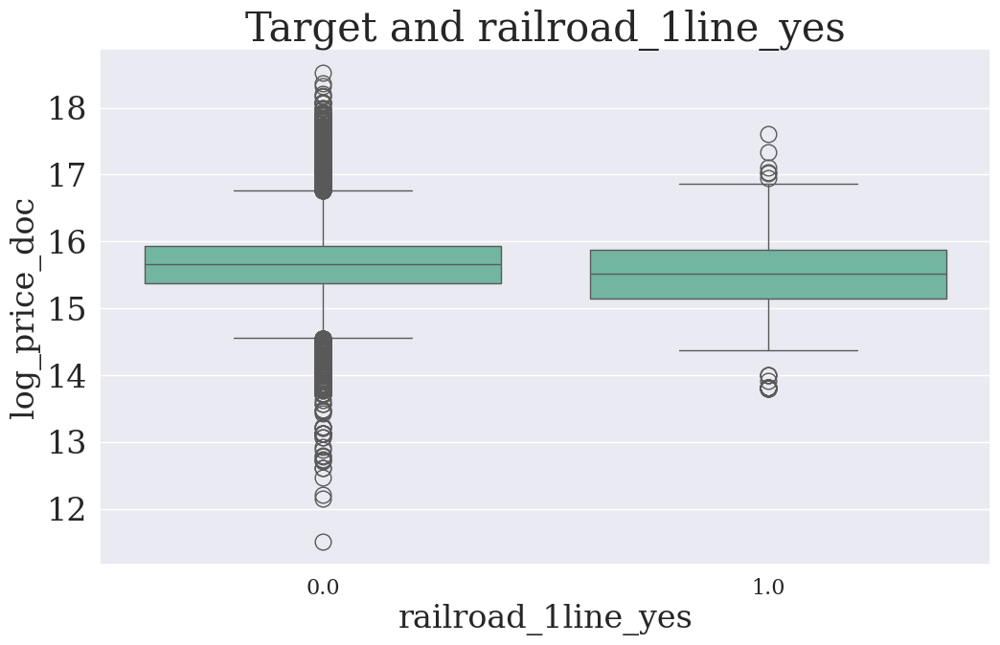

...

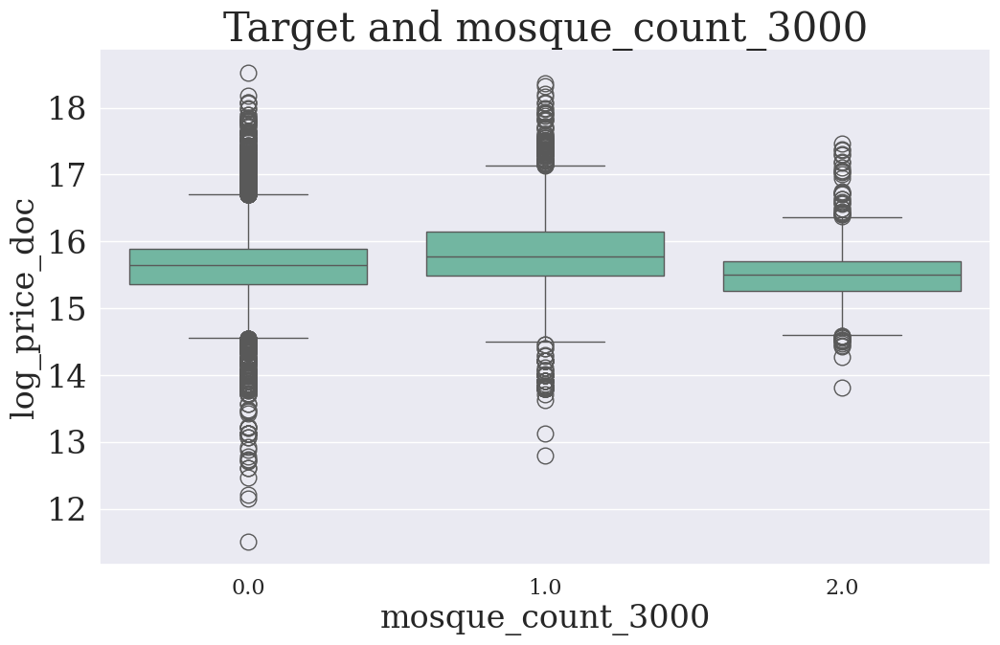

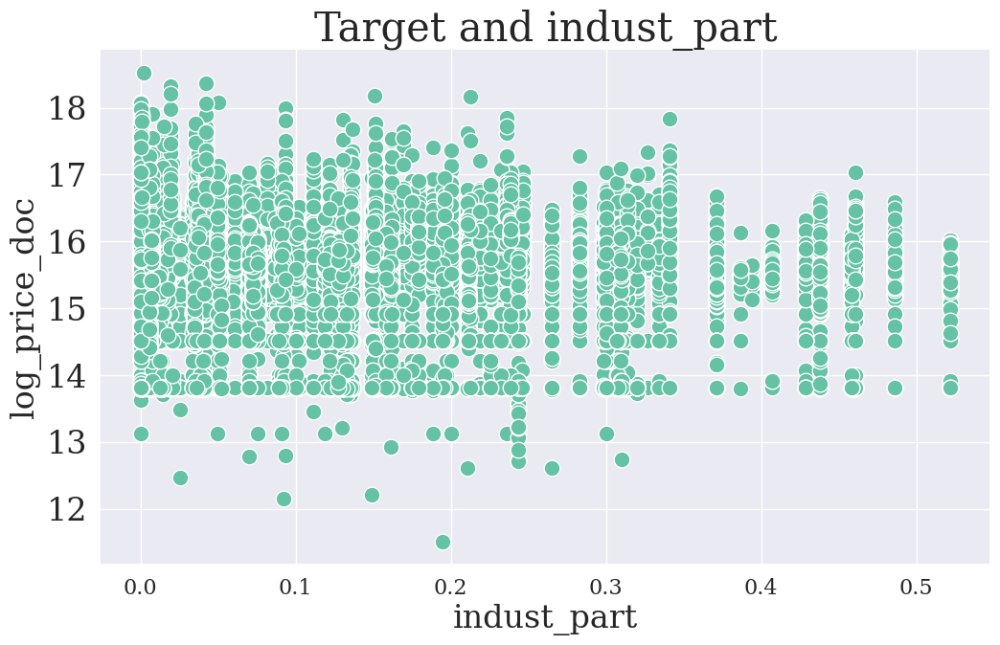

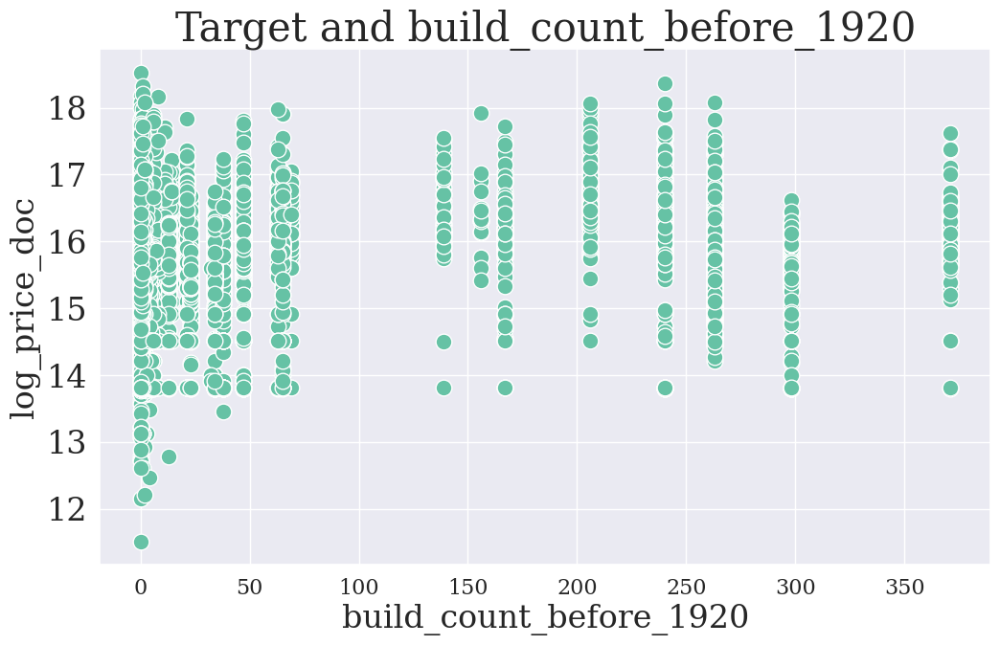

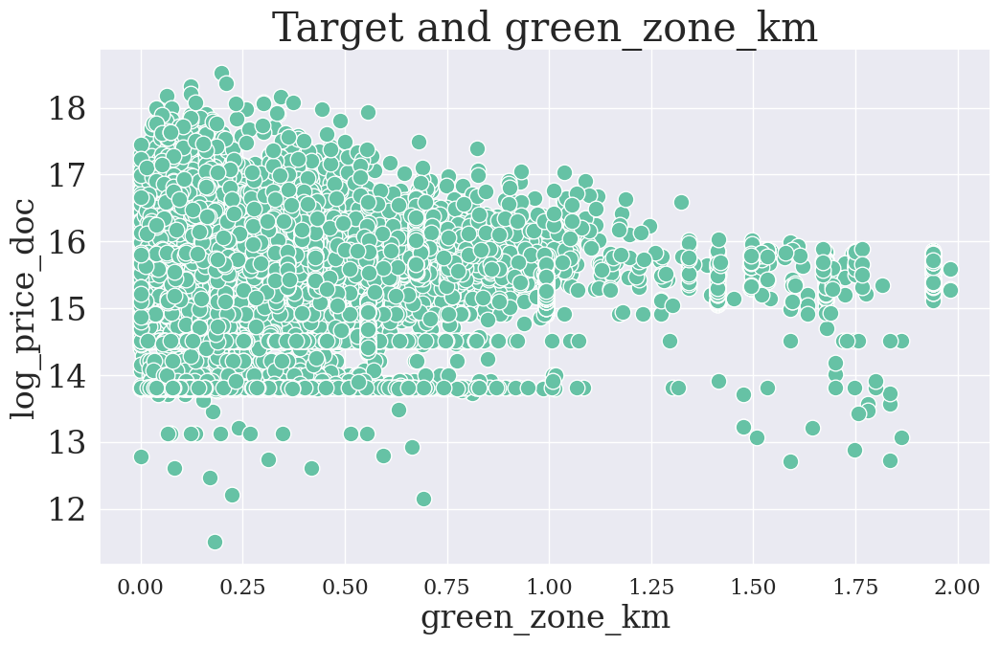

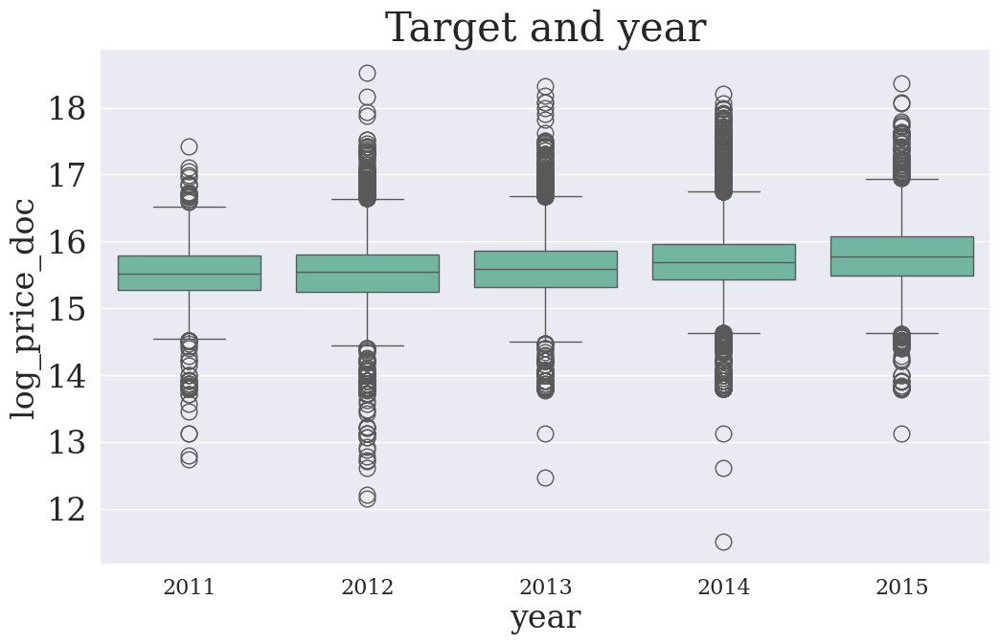

In [35]:
for col in df_train_filt_2.columns:
    if col == 'log_price_doc':
        continue
    
    plt.figure(figsize=(12, 7))
    if df_train_filt_2[col].nunique() < 20:
        sns.boxplot(y=df_train_filt_2['log_price_doc'], x=df_train_filt_2[col].astype('category'))
        plt.title(f"Target and {col}")
    else:
        sns.scatterplot(y=df_train_filt_2['log_price_doc'], x=df_train_filt_2[col])
        plt.title(f"Target and {col}")
    
    plt.show()

full_sq, life_sq --> set upper limit to 1000

In [36]:
df_train_filt_2['full_sq'] = np.clip(df_train_filt_2['full_sq'], a_min=0, a_max=1000)
df_train_filt_2['life_sq'] = np.clip(df_train_filt_2['life_sq'], a_min=0, a_max=1000)

### Cluster analysis

In [37]:
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from umap import UMAP

PCA

In [38]:
SEED = 42

X = df_train_filt_2.drop('log_price_doc', axis=1)
Y = target
scaler = StandardScaler()
X_norm = scaler.fit_transform(X)

pca = PCA(n_components=X.shape[1], random_state=SEED)
X_decomposed = pca.fit_transform(X_norm)

<Axes: >

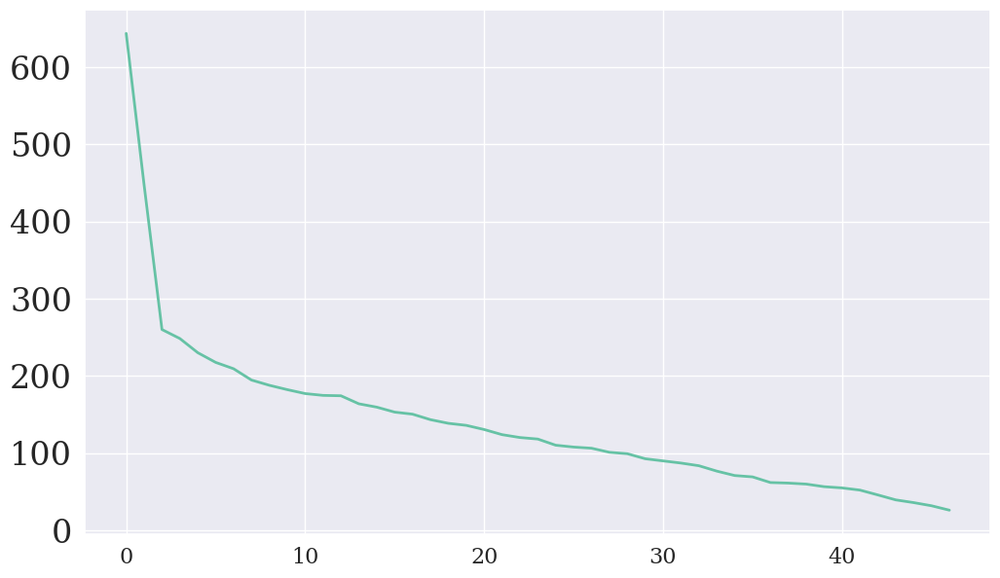

In [39]:
sns.lineplot(pca.singular_values_)

UMap

In [40]:
umap = UMAP()
X_umap = umap.fit_transform(X_norm)

/home/eduard/git/ymnik432/env/lib/python3.10/site-packages/numba/np/ufunc/parallel.py:371: NumbaWarning: The TBB threading layer requires TBB version 2021 update 6 or later i.e., TBB_INTERFACE_VERSION >= 12060. Found TBB_INTERFACE_VERSION = 12050. The TBB threading layer is disabled.
  warnings.warn(problem)
/home/eduard/git/ymnik432/env/lib/python3.10/site-packages/sklearn/manifold/_spectral_embedding.py:301: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


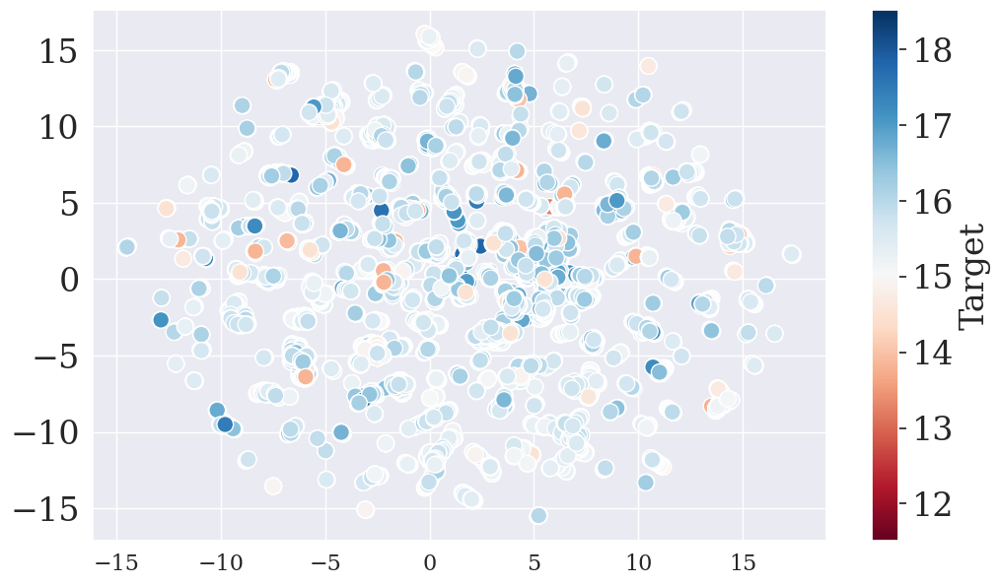

In [46]:
ax = sns.scatterplot(x=X_umap[:, 0], y=X_umap[:, 1], palette='RdBu', hue=target)

norm = plt.Normalize(target.min(), target.max())
sm = plt.cm.ScalarMappable(cmap="RdBu", norm=norm)
sm.set_array([])

# Remove the legend and add a colorbar
ax.get_legend().remove()
cbar = plt.colorbar(sm, ax=ax, orientation='vertical')  # Add the colorbar to the same Axes
cbar.set_label("Target")

plt.show()

t-SNE

In [43]:
tsne = TSNE()
X_tsne = tsne.fit_transform(X_norm)

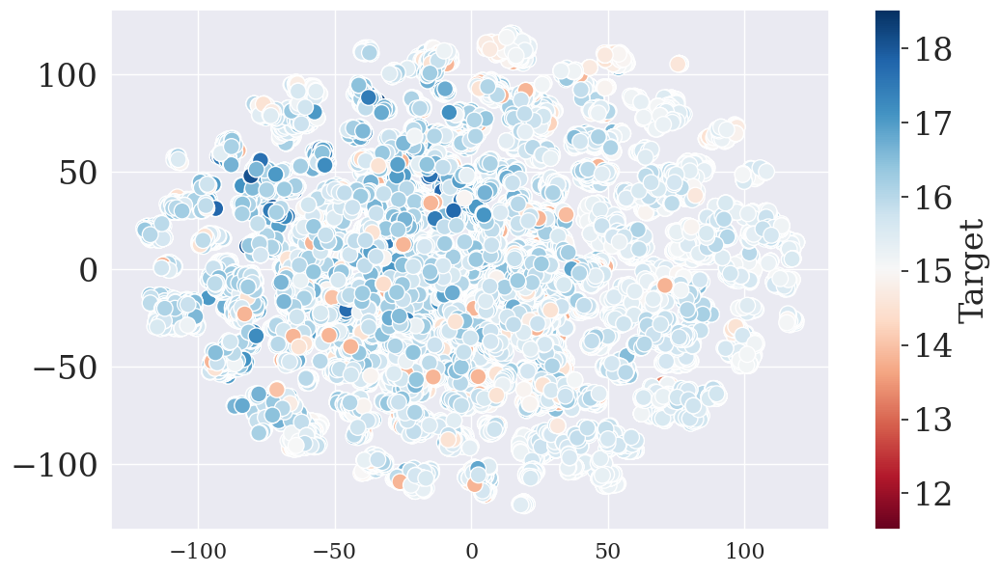

In [45]:
ax = sns.scatterplot(x=X_tsne[:, 0], y=X_tsne[:, 1], palette='RdBu', hue=target)

norm = plt.Normalize(target.min(), target.max())
sm = plt.cm.ScalarMappable(cmap="RdBu", norm=norm)
sm.set_array([])

# Remove the legend and add a colorbar
ax.get_legend().remove()
cbar = plt.colorbar(sm, ax=ax, orientation='vertical')  # Add the colorbar to the same Axes
cbar.set_label("Target")

plt.show()

There's nothing interesting

### Model's training

Let's split the sample into training and validation, and look at the quality of the prediction.

In [47]:
X_train, X_val, y_train, y_val = train_test_split(
    df_train_filt_2.drop('log_price_doc', axis=1),
    target,
    test_size=0.2,
    random_state=SEED
)

#### Gradient Boosting

In [ ]:
model = CatBoostRegressor(iterations=1000, depth=5, verbose=False)

# Train the model
model.fit(X_train, y_train)
pred_train = model.predict(X_train)
pred_val = model.predict(X_val)

R^2 and RMSLE on the training and validation sample

In [48]:
def r2_score_custom(y_true, y_pred):
    return r2_score(np.exp(y_true) - 1, np.exp(y_pred) - 1)


def rmsle_custom(y_true, y_pred):
    return mean_squared_error(y_true, y_pred)**0.5


print("R^2 on training and validation dataset:")
print(r2_score_custom(y_train, pred_train), r2_score_custom(y_val, pred_val))


print("RMSLE on training and validation dataset:")
print(rmsle_custom(y_train, pred_train), rmsle_custom(y_val, pred_val))

R^2 on training and validation dataset:
0.7754562882820077 0.665861509621215
RMSLE on training and validation dataset:
0.4014184325187481 0.45502067030317767


#### Linear regression

In [52]:
lin_model = LinearRegression()
lin_model.fit(X_train, y_train)

pred_train = lin_model.predict(X_train)
pred_val = lin_model.predict(X_val)

In [53]:
print("R^2 on training and validation dataset:")
print(r2_score_custom(y_train, pred_train), r2_score_custom(y_val, pred_val))


print("RMSLE on training and validation dataset:")
print(rmsle_custom(y_train, pred_train), rmsle_custom(y_val, pred_val))

R^2 on training and validation dataset:
-49.48711028705213 -0.649321603074902
RMSLE on training and validation dataset:
0.4829892890254116 0.47821548158137805


According to all metrics, gradient boosting is a better model

Let's use grid-search to choose best parameters

In [69]:
param_grid = {
    'learning_rate': [0.01, 0.03, 0.1],
    'depth': [3, 5, 7],
    'l2_leaf_reg': [1, 3, 5],
}

kf = KFold(n_splits=3, shuffle=True, random_state=SEED)
r2_scores = []
X = df_train_filt_2.drop('log_price_doc', axis=1)
Y = target

for params in ParameterGrid(param_grid):
    print(f"Testing parameters: {params}")
    fold_r2_scores = []

    for train_index, test_index in kf.split(X):
        X_train_fold, X_test_fold = X.iloc[train_index], X.iloc[test_index]
        y_train_fold, y_test_fold = Y[train_index], Y[test_index]
        
        catboost_model = CatBoostRegressor(
            random_seed=SEED,
            task_type='CPU',
            verbose=False,
            iterations=150,
            **params
        )

        train_pool = Pool(X_train_fold, y_train_fold)
        catboost_model.fit(train_pool)
        
        y_pred_fold = catboost_model.predict(X_test_fold)
        r2_score_val = r2_score_custom(y_test_fold, y_pred_fold)
        fold_r2_scores.append(r2_score_val)

    avg_r2_score, std_r2_score = np.mean(fold_r2_scores), np.std(fold_r2_scores)
    r2_scores.append((params, avg_r2_score - std_r2_score))
    print(f"Average R2 score for parameters {params}: {avg_r2_score:.4f} ± {std_r2_score:.4f}")

best_params = max(r2_scores, key=lambda x: x[1])
print(f"Best parameters: {best_params[0]} with R2 score: {best_params[1]}")

Testing parameters: {'depth': 3, 'l2_leaf_reg': 1, 'learning_rate': 0.01}
Average R2 score for parameters {'depth': 3, 'l2_leaf_reg': 1, 'learning_rate': 0.01}: 0.3459 ± 0.0108
Testing parameters: {'depth': 3, 'l2_leaf_reg': 1, 'learning_rate': 0.03}
Average R2 score for parameters {'depth': 3, 'l2_leaf_reg': 1, 'learning_rate': 0.03}: 0.5227 ± 0.0052
Testing parameters: {'depth': 3, 'l2_leaf_reg': 1, 'learning_rate': 0.1}
Average R2 score for parameters {'depth': 3, 'l2_leaf_reg': 1, 'learning_rate': 0.1}: 0.6081 ± 0.0057
Testing parameters: {'depth': 3, 'l2_leaf_reg': 3, 'learning_rate': 0.01}
Average R2 score for parameters {'depth': 3, 'l2_leaf_reg': 3, 'learning_rate': 0.01}: 0.3460 ± 0.0108
Testing parameters: {'depth': 3, 'l2_leaf_reg': 3, 'learning_rate': 0.03}
Average R2 score for parameters {'depth': 3, 'l2_leaf_reg': 3, 'learning_rate': 0.03}: 0.5222 ± 0.0050
Testing parameters: {'depth': 3, 'l2_leaf_reg': 3, 'learning_rate': 0.1}
Average R2 score for parameters {'depth': 3,

In [68]:
best_params = max(r2_scores, key=lambda x: x[1])
print(f"Best parameters: {best_params[0]} with IoU score: {best_params[1]}")

Best parameters: {'depth': 7, 'l2_leaf_reg': 1, 'learning_rate': 0.1} with IoU score: 0.6288625653924467
